### Introduction

This IBM Sample Dataset has information about Telco customers and if they left the company within the last month (churn). Each row represents a unique costumer, while the columns contains information about customer’s services, account and demographic data. We will be using Python and Seaborn library to plot and analyze the data.

7043 rows, There are 21 columns with 19 features.

#### Basic Libraries

In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.datasets import make_classification
from sklearn.neighbors import KNeighborsClassifier
from sklearn.inspection import permutation_importance

#### Churn Data

In [9]:
df =pd.read_csv("C:/Users/dell/Desktop/churn.csv")

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


In [10]:
df.shape

(7043, 21)

In [11]:
X = df.drop(['customerID','Churn'],axis=1)
Y = df['Churn']

Text(0.5, 1.0, 'Target Variable "Churn"')

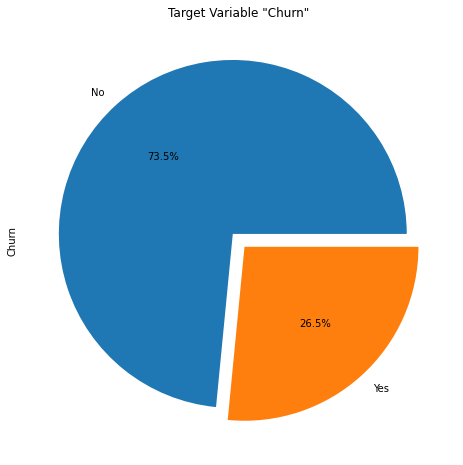

In [12]:
plt.figure(figsize=(8,8))
df.Churn.value_counts().plot(kind='pie',autopct='%1.1f%%',explode=(0.05,0.05))
plt.title('Target Variable "Churn"')

#### Missing Values

In [13]:
df.isnull().sum()

customerID          0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

### Feature Engineering

##### Categorical Features

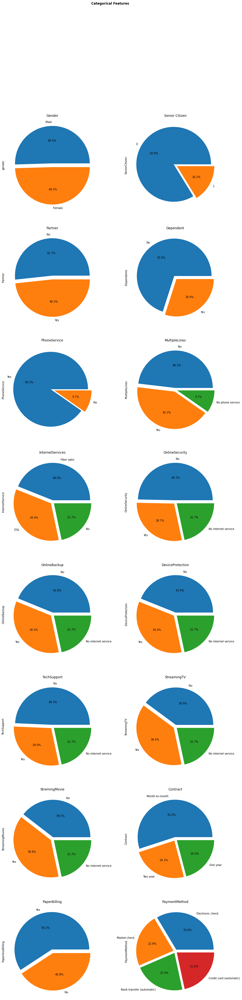

In [14]:
fig, (ax) = plt.subplots(8, 2, figsize=(15,60))

feat = df[['gender', 'SeniorCitizen', 'Partner', 'Dependents',
       'PhoneService', 'MultipleLines', 'InternetService',
       'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport',
       'StreamingTV', 'StreamingMovies', 'Contract', 'PaperlessBilling',
       'PaymentMethod']]

feat['gender'].value_counts().plot(kind='pie',autopct='%1.1f%%',explode=(0.05,0.05),ax =ax[0][0])
ax[0][0].set_title('Gender')
feat['SeniorCitizen'].value_counts().plot(kind='pie',autopct='%1.1f%%',explode=(0.05,0.05),ax =ax[0][1])
ax[0][1].set_title('Senior Citizen')
feat['Partner'].value_counts().plot(kind='pie',autopct='%1.1f%%',explode=(0.05,0.05),ax =ax[1][0])
ax[1][0].set_title('Partner')
feat['Dependents'].value_counts().plot(kind='pie',autopct='%1.1f%%',explode=(0.05,0.05),ax =ax[1][1])
ax[1][1].set_title('Dependent')
feat['PhoneService'].value_counts().plot(kind='pie',autopct='%1.1f%%',explode=(0.05,0.05),ax =ax[2][0])
ax[2][0].set_title('PhoneService')
feat['MultipleLines'].value_counts().plot(kind='pie',autopct='%1.1f%%',explode=(0.05,0.05,0.05),ax =ax[2][1])
ax[2][1].set_title('MultipleLines')
feat['InternetService'].value_counts().plot(kind='pie',autopct='%1.1f%%',explode=(0.05,0.05,0.05),ax =ax[3][0])
ax[3][0].set_title('InternetServices')
feat['OnlineSecurity'].value_counts().plot(kind='pie',autopct='%1.1f%%',explode=(0.05,0.05,0.05),ax =ax[3][1])
ax[3][1].set_title('OnlineSecurity')
feat['OnlineBackup'].value_counts().plot(kind='pie',autopct='%1.1f%%',explode=(0.05,0.05,0.05),ax =ax[4][0])
ax[4][0].set_title('OnlineBackup')
feat['DeviceProtection'].value_counts().plot(kind='pie',autopct='%1.1f%%',explode=(0.05,0.05,0.05),ax =ax[4][1])
ax[4][1].set_title('DeviceProtection')
feat['TechSupport'].value_counts().plot(kind='pie',autopct='%1.1f%%',explode=(0.05,0.05,0.05),ax =ax[5][0])
ax[5][0].set_title('TechSupport')
feat['StreamingTV'].value_counts().plot(kind='pie',autopct='%1.1f%%',explode=(0.05,0.05,0.05),ax =ax[5][1])
ax[5][1].set_title('StreamingTV')
feat['StreamingMovies'].value_counts().plot(kind='pie',autopct='%1.1f%%',explode=(0.05,0.05,0.05),ax =ax[6][0])
ax[6][0].set_title('StremingMovie')
feat['Contract'].value_counts().plot(kind='pie',autopct='%1.1f%%',explode=(0.05,0.05,0.05),ax =ax[6][1])
ax[6][1].set_title('Contract')
feat['PaperlessBilling'].value_counts().plot(kind='pie',autopct='%1.1f%%',explode=(0.05,0.05),ax =ax[7][0])
ax[7][0].set_title('PaperBilling')
feat['PaymentMethod'].value_counts().plot(kind='pie',autopct='%1.1f%%',explode=(0.05,0.05,0.05,0.05),ax =ax[7][1])
ax[7][1].set_title('PaymentMethod')

plt.suptitle(
    "Categorical Features", fontweight="bold")
plt.show()

In [15]:
feat = feat.astype('category')

In [16]:
categorical_features = pd.get_dummies(feat)

##### Numerical features

In [17]:
X.tenure = df.tenure.astype(int)

In [18]:
X.TotalCharges = pd.to_numeric(X.TotalCharges, errors='coerce')

In [19]:
numerical_features = X[['tenure','MonthlyCharges','TotalCharges']]

Text(0.5, 1.0, 'Tenure Distribution')

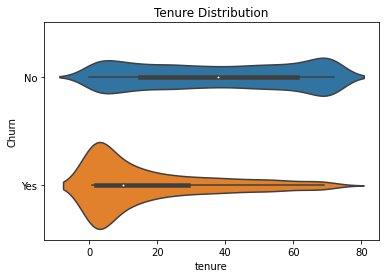

In [20]:
## Tenure
sns.violinplot(x=X.tenure, y=Y)
plt.title('Tenure Distribution')

Text(0.5, 1.0, 'Monthly Charges Distribution')

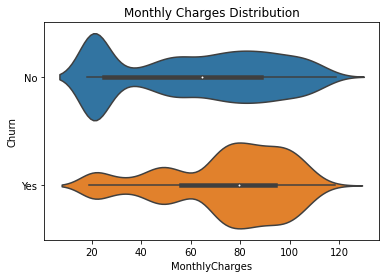

In [21]:
## Monthly Charges
sns.violinplot(x=X.MonthlyCharges, y=Y)
plt.title('Monthly Charges Distribution')

Text(0.5, 1.0, 'Total Charges Distribution')

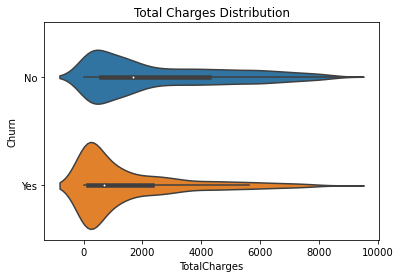

In [22]:
## Total Charges
sns.violinplot(x=X.TotalCharges, y=Y)
plt.title('Total Charges Distribution')

### ReCreating Data

In [23]:
dat = categorical_features
for col in numerical_features:
    dat[col] = numerical_features[col]

In [24]:
dat.shape

(7043, 46)

##### Correlation

In [25]:
labelencoder = LabelEncoder()
daf = dat
daf['Y'] = Y
daf.Y = labelencoder.fit_transform(daf.Y)

<AxesSubplot:title={'center':'Correlation'}>

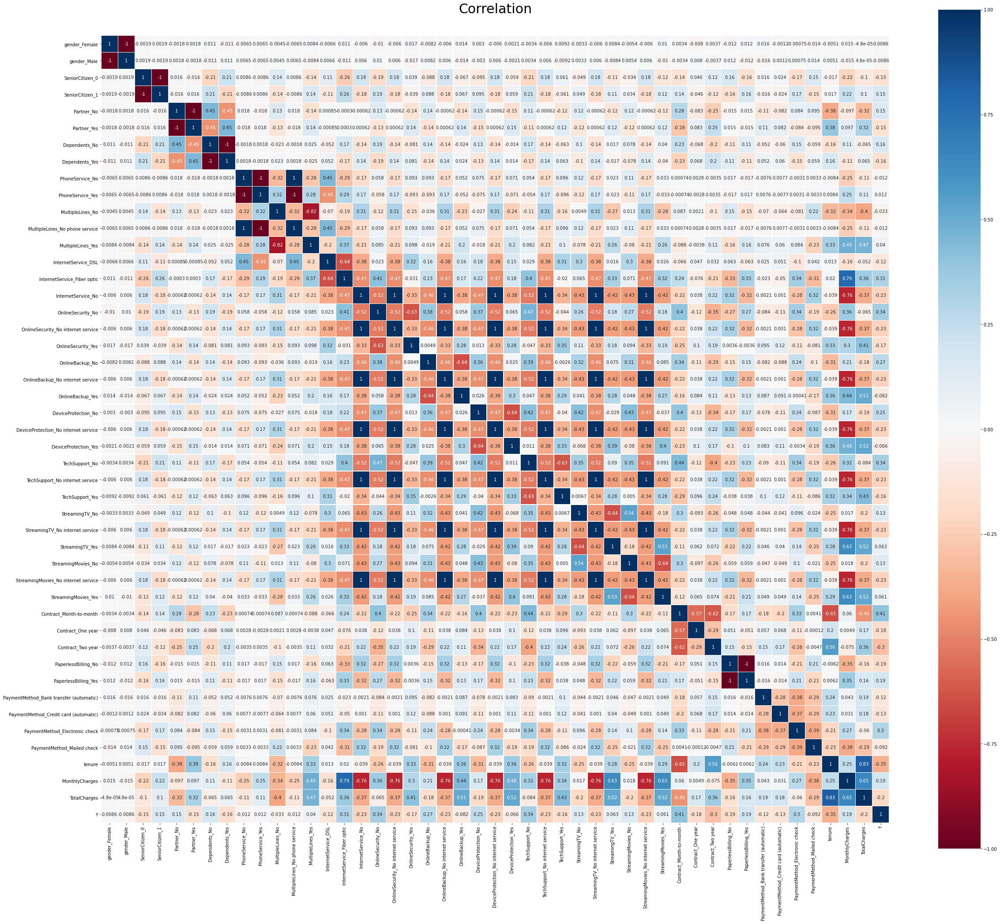

In [26]:
colormap = plt.cm.RdBu
plt.figure(figsize=(40,35))
plt.title('Correlation', y=1.025, size=30)
sns.heatmap(daf.astype(float).corr(),linewidths=0.1,vmax=1.0, 
            square=True, cmap=colormap, linecolor='white', annot=True)

<AxesSubplot:title={'center':'Correlation'}>

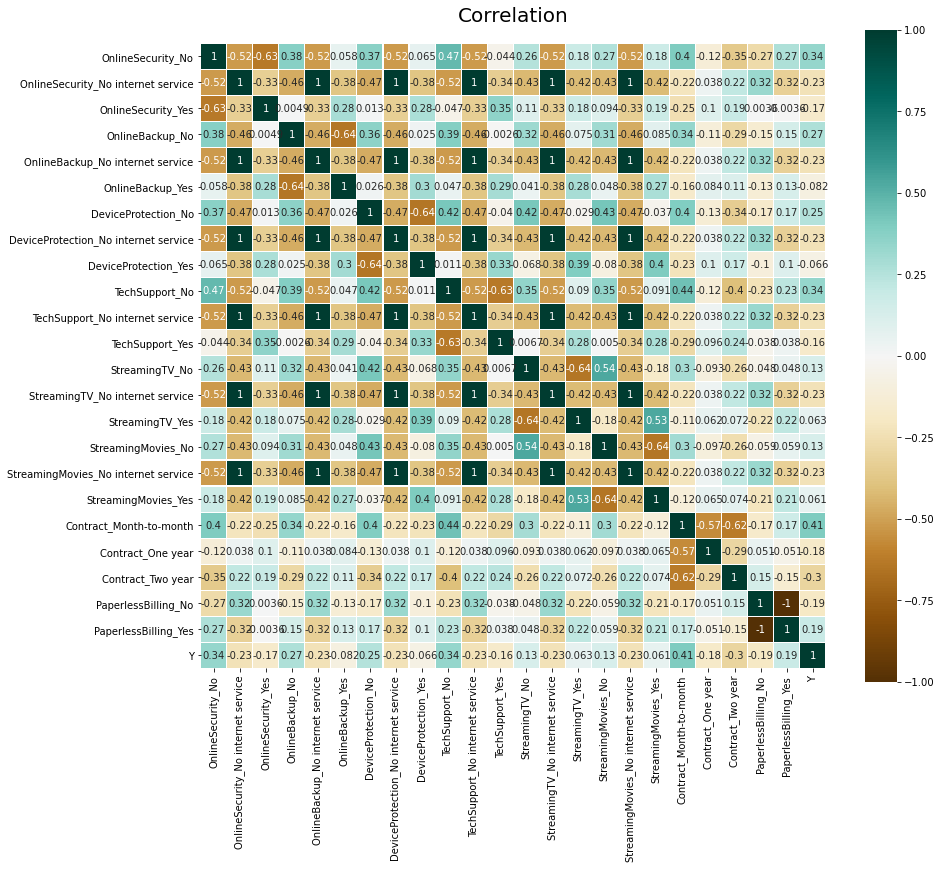

In [21]:
colormap = plt.cm.BrBG
plt.figure(figsize=(14,12))
plt.title('Correlation', y=1.025, size=20)
sns.heatmap(daf[['OnlineSecurity_No',
       'OnlineSecurity_No internet service', 'OnlineSecurity_Yes',
       'OnlineBackup_No', 'OnlineBackup_No internet service',
       'OnlineBackup_Yes', 'DeviceProtection_No',
       'DeviceProtection_No internet service', 'DeviceProtection_Yes',
       'TechSupport_No', 'TechSupport_No internet service', 'TechSupport_Yes',
       'StreamingTV_No', 'StreamingTV_No internet service', 'StreamingTV_Yes',
       'StreamingMovies_No', 'StreamingMovies_No internet service',
       'StreamingMovies_Yes', 'Contract_Month-to-month', 'Contract_One year',
       'Contract_Two year', 'PaperlessBilling_No', 'PaperlessBilling_Yes','Y']].astype(float).corr(),linewidths=0.1,vmax=1.0, 
            square=True, cmap=colormap, linecolor='white', annot=True)

##### Outlier Detetction

Text(0.5, 1.0, 'Monthly Charges Distribution')

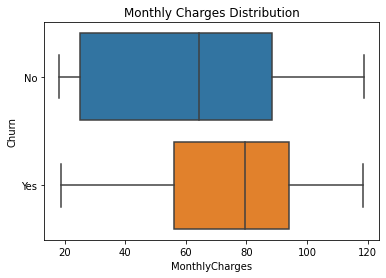

In [27]:
# Monthly Charges
sns.boxplot(x=X.MonthlyCharges, y=Y)
plt.title('Monthly Charges Distribution')

Text(0.5, 1.0, 'Tenure Distribution')

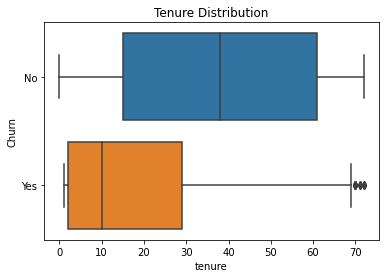

In [28]:
#Tenure
sns.boxplot(x=X.tenure, y=Y)
plt.title('Tenure Distribution')

In [29]:
dat.tenure[dat.tenure > 70].value_counts()

72    362
71    170
Name: tenure, dtype: int64

Text(0.5, 1.0, 'Total Charges Distribution')

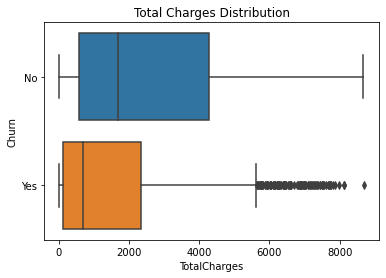

In [30]:
# Total Charges
sns.boxplot(x=X.TotalCharges, y=Y)
plt.title('Total Charges Distribution')

#### Sorting Dataset

In [31]:
data_X = dat.drop(['Y'],axis=1) 
data_X.shape

(7043, 46)

In [32]:
data_Y = dat.Y

##### Missing Values

In [33]:
total = data_X.isnull().sum().sort_values(ascending=False) # missing values analysis
percent = (data_X.isnull().sum()/data_X.isnull().count()).sort_values(ascending=False) # percentage of missing values 
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(5)

,Total,Percent
TotalCharges,11,0.001562
MultipleLines_No phone service,0,0.000000
OnlineBackup_No internet service,0,0.000000
OnlineBackup_No,0,0.000000
OnlineSecurity_Yes,0,0.000000


In [34]:
data_X.TotalCharges.fillna(data_X.TotalCharges.median(), inplace = True)

In [35]:
data_X.TotalCharges.isnull().sum()

0

In [36]:
from sklearn.model_selection import train_test_split

X_train, X_test, Y_train, Y_test = train_test_split(data_X, data_Y, test_size = 0.2) 

In [37]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X__train = scaler.fit_transform(X_train)
X__test = scaler.transform(X_test)

##### PFI (Permutation Feature Importance)

##### KNN total feature PFI

Feature: 0, Score: -0.00366
Feature: 1, Score: -0.00366
Feature: 2, Score: -0.00007
Feature: 3, Score: 0.00000
Feature: 4, Score: -0.00089
Feature: 5, Score: -0.00089
Feature: 6, Score: 0.00004
Feature: 7, Score: 0.00004
Feature: 8, Score: -0.00046
Feature: 9, Score: -0.00046
Feature: 10, Score: 0.00341
Feature: 11, Score: -0.00046
Feature: 12, Score: 0.00362
Feature: 13, Score: 0.00195
Feature: 14, Score: 0.00188
Feature: 15, Score: 0.00025
Feature: 16, Score: 0.00121
Feature: 17, Score: 0.00025
Feature: 18, Score: 0.00131
Feature: 19, Score: 0.00007
Feature: 20, Score: 0.00025
Feature: 21, Score: -0.00014
Feature: 22, Score: 0.00266
Feature: 23, Score: 0.00025
Feature: 24, Score: 0.00252
Feature: 25, Score: -0.00007
Feature: 26, Score: 0.00025
Feature: 27, Score: 0.00202
Feature: 28, Score: -0.00018
Feature: 29, Score: 0.00025
Feature: 30, Score: 0.00128
Feature: 31, Score: -0.00202
Feature: 32, Score: 0.00025
Feature: 33, Score: -0.00167
Feature: 34, Score: 0.00032
Feature: 35, Scor

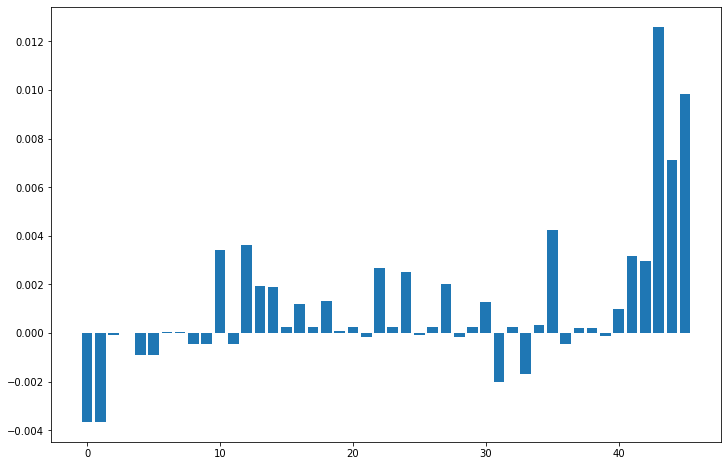

In [33]:
plt.figure(figsize=(12,8))
model = KNeighborsClassifier()
model.fit(X__train, Y_train)
results = permutation_importance(model, X__train, Y_train, scoring='accuracy')
importance = results.importances_mean

for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f' % (i,v))

plt.bar([x for x in range(len(importance))], importance)
plt.show()

##### KNN Numerical Feature PFI

Feature: 0, Score: 0.01451
Feature: 1, Score: 0.15420
Feature: 2, Score: 0.17532


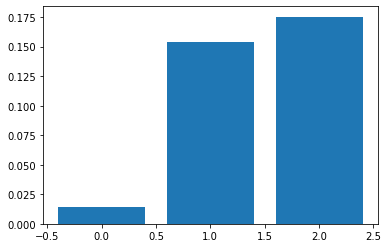

In [34]:
model = KNeighborsClassifier()
model.fit(data_X[['tenure','MonthlyCharges','TotalCharges',]], data_Y)
results = permutation_importance(model, data_X[['tenure','MonthlyCharges','TotalCharges']], data_Y, scoring='accuracy')
importance = results.importances_mean

for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f' % (i,v))

plt.bar([x for x in range(len(importance))], importance)
plt.show()

##### KNN Label Encoded Feature PFI

In [38]:
data_le = feat
for cols in feat:
    data_le[cols] = labelencoder.fit_transform(feat[cols])
    
data_le['tenure'] = data_X['tenure']
data_le['MonthlyCharges'] = data_X['MonthlyCharges']
data_le['TotalCharges'] = data_X['TotalCharges']

<AxesSubplot:title={'center':'Correlation'}>

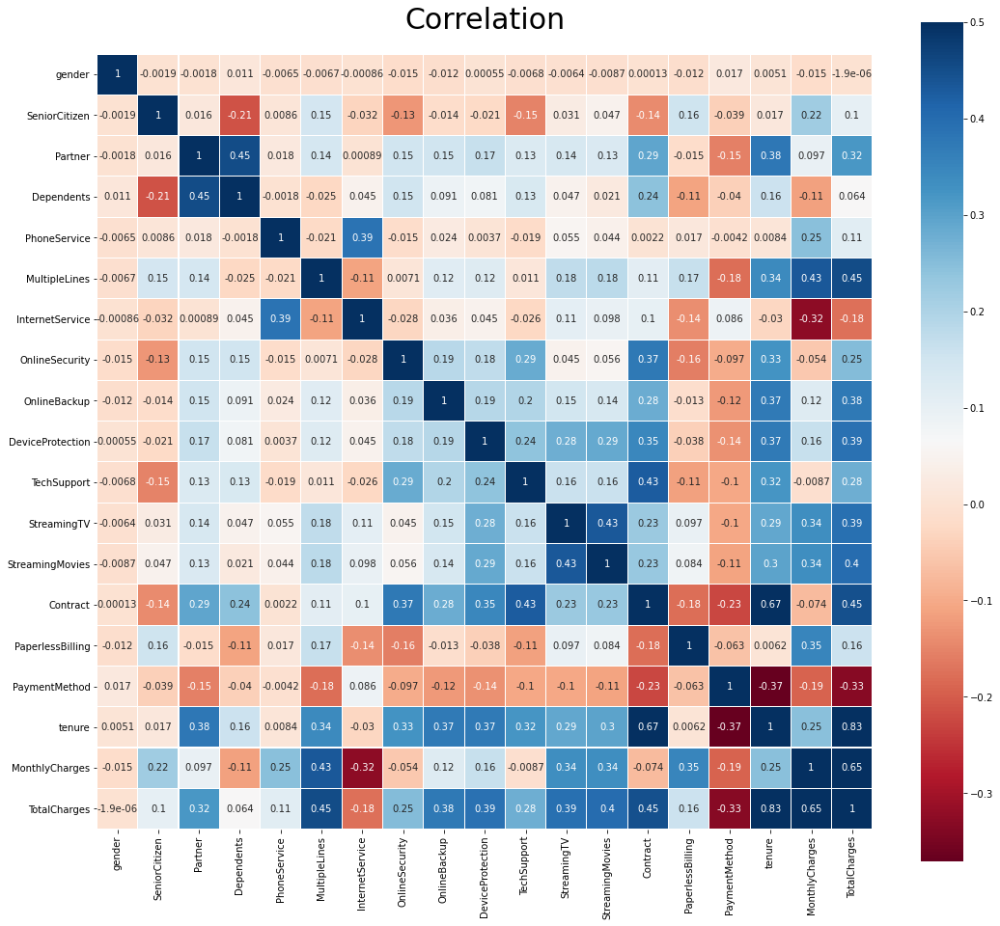

In [37]:
colormap = plt.cm.RdBu
plt.figure(figsize=(18,16))
plt.title('Correlation', y=1.025, size=30)
sns.heatmap(data_le.astype(float).corr(),linewidths=0.1,vmax=0.5, 
            square=True, cmap=colormap, linecolor='white', annot=True)

In [39]:
X_tr, X_t, Y_tr, Y_t = train_test_split(data_le, data_Y, test_size = 0.2)

X__tr = scaler.fit_transform(X_tr)
X__t = scaler.transform(X_t)

Feature: 0, Score: 0.00958
Feature: 1, Score: 0.01793
Feature: 2, Score: 0.00667
Feature: 3, Score: 0.00550
Feature: 4, Score: 0.00856
Feature: 5, Score: 0.00831
Feature: 6, Score: 0.00930
Feature: 7, Score: 0.01711
Feature: 8, Score: 0.01044
Feature: 9, Score: 0.00738
Feature: 10, Score: 0.00731
Feature: 11, Score: 0.00589
Feature: 12, Score: 0.00767
Feature: 13, Score: 0.00586
Feature: 14, Score: 0.01207
Feature: 15, Score: 0.01164
Feature: 16, Score: 0.01782
Feature: 17, Score: 0.01108
Feature: 18, Score: 0.01154


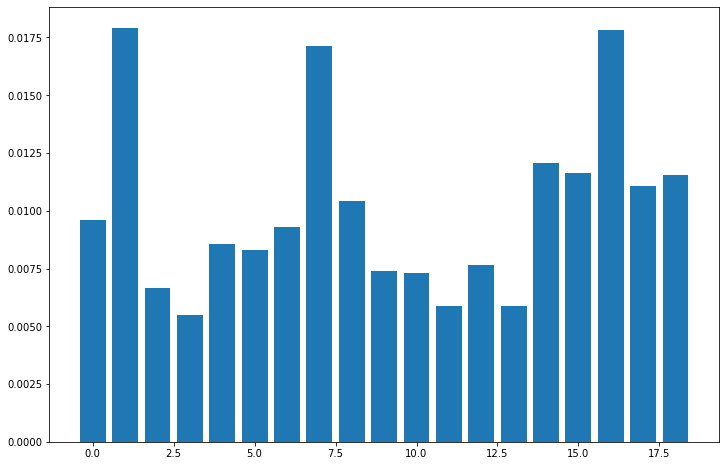

In [39]:
plt.figure(figsize=(12,8))
model = KNeighborsClassifier()
model.fit(X__tr, Y_tr)
results = permutation_importance(model, X__tr, Y_tr, scoring='accuracy')
importance = results.importances_mean

for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f' % (i,v))

plt.bar([x for x in range(len(importance))], importance)
plt.show()

##### GradientBoost Label ENcoded Feature PFI

In [40]:
from sklearn.ensemble import GradientBoostingClassifier,RandomForestClassifier

classifier = GradientBoostingClassifier()
classifier.fit(X__tr, Y_tr)

GradientBoostingClassifier()

In [41]:
classifier.feature_importances_

array([0.00215965, 0.00735153, 0.00111364, 0.00193595, 0.00125938,
       0.00936137, 0.00956216, 0.08401597, 0.01068384, 0.00124787,
       0.05174454, 0.00293667, 0.00378639, 0.40292726, 0.01465454,
       0.03215211, 0.15720769, 0.1225648 , 0.08333464])

##### Multi Layer Perceptron Feature Importance

In [42]:
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import StandardScaler

MLP = MLPClassifier(hidden_layer_sizes=(20,6))
MLP.fit(X__tr, Y_tr)

C:\Users\dell\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:585: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


MLPClassifier(hidden_layer_sizes=(20, 6))

Feature: 0, Score: 0.01282
Feature: 1, Score: 0.01086
Feature: 2, Score: 0.01005
Feature: 3, Score: 0.00554
Feature: 4, Score: 0.00813
Feature: 5, Score: 0.01147
Feature: 6, Score: 0.01718
Feature: 7, Score: 0.01665
Feature: 8, Score: 0.01292
Feature: 9, Score: 0.00412
Feature: 10, Score: 0.01349
Feature: 11, Score: 0.01374
Feature: 12, Score: 0.01242
Feature: 13, Score: 0.03852
Feature: 14, Score: 0.01037
Feature: 15, Score: 0.01601
Feature: 16, Score: 0.05659
Feature: 17, Score: 0.04129
Feature: 18, Score: 0.01906


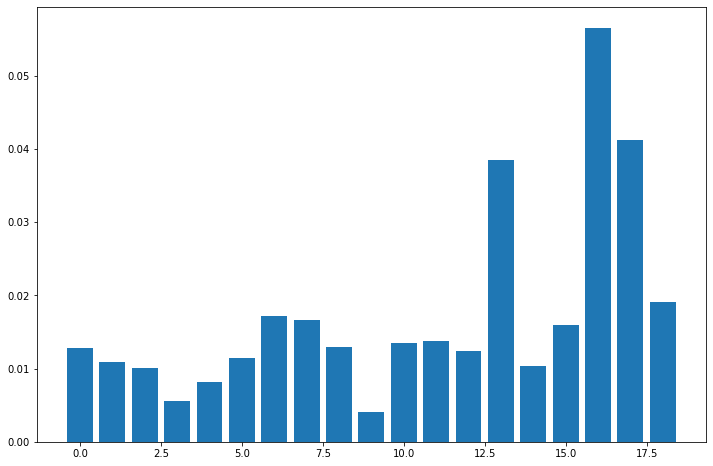

In [43]:
plt.figure(figsize=(12,8))
results = permutation_importance(MLP, X__tr, Y_tr, scoring='accuracy')
importance = results.importances_mean

for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f' % (i,v))

plt.bar([x for x in range(len(importance))], importance)
plt.show()

In [44]:
'''
lsst = []
for i in range(20):    
    minimum,maximum = data_le[:,i].min(), data_le[:,i].max()  # minimum and maximum value of tenure
    arr = np.arange(minimum, maximum, (maximum - minimum)/100) # randomized array between min and max of 100 values

    lst = []
    for variation in arr:
        val = list(data_le.median().values) # saving all rows median values in a list
        val[i] = variation
        lst.append(val)  
    lst = np.array(lst)
    lst = scaler.transform(lst)
    MLP.predict(lst)
'''

'\nlsst = []\nfor i in range(20):    \n    minimum,maximum = data_le[:,i].min(), data_le[:,i].max()  # minimum and maximum value of tenure\n    arr = np.arange(minimum, maximum, (maximum - minimum)/100) # randomized array between min and max of 100 values\n\n    lst = []\n    for variation in arr:\n        val = list(data_le.median().values) # saving all rows median values in a list\n        val[i] = variation\n        lst.append(val)  \n    lst = np.array(lst)\n    lst = scaler.transform(lst)\n    MLP.predict(lst)\n'

### SHAP Explainer

###### Variable Importance Plot — Global Interpretability

In [45]:
import shap
from sklearn.ensemble import RandomForestClassifier

RFC = RandomForestClassifier(max_depth=8, random_state=19)
RFC.fit(X__tr, Y_tr)

RandomForestClassifier(max_depth=8, random_state=19)

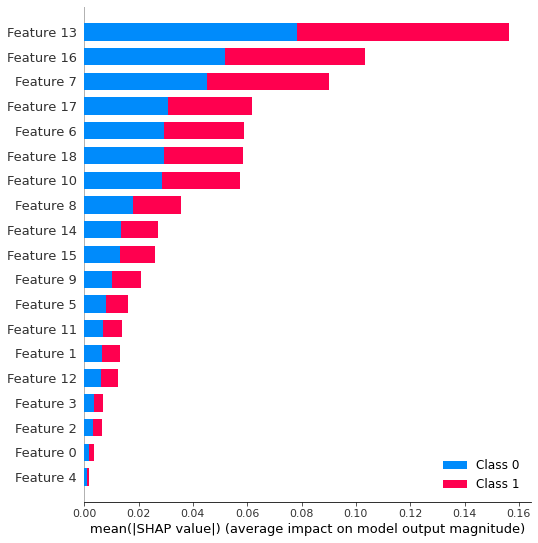

In [46]:
shap_values = shap.TreeExplainer(RFC).shap_values(X__tr)
shap.summary_plot(shap_values, X__tr)

##### XGBoost SHAP

In [47]:
import xgboost

# train XGBoost model
 
model_ = xgboost.XGBClassifier().fit(X__tr, Y_tr)

# compute SHAP values
shap_values = shap.TreeExplainer(model_).shap_values(X__tr)


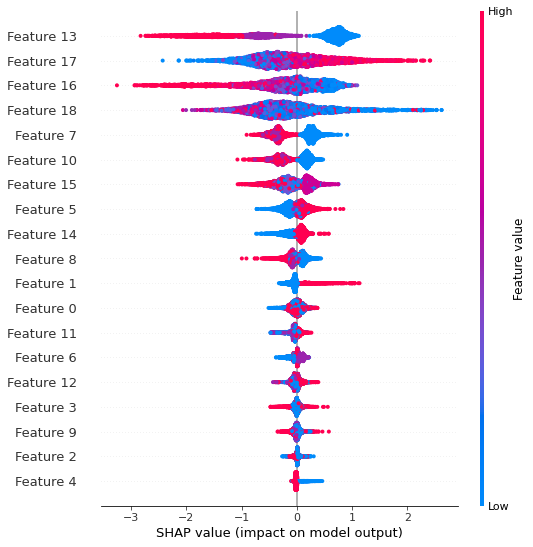

In [48]:
shap.summary_plot(shap_values, X__tr)

##### SHAP Analysis

In [149]:
data_for_prediction = pd.DataFrame(X__tr).iloc[35]  # use 1 row of data here. Could use multiple rows if desired
data_for_prediction_array = data_for_prediction.values.reshape(1, -1)


print(model_.predict_proba(data_for_prediction_array))

[[0.9029759 0.0970241]]


In [77]:
explainer = shap.TreeExplainer(model_)
shap_values = explainer.shap_values(X__tr)

In [150]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[0], data_for_prediction_array)

In [124]:
shap.force_plot(explainer.expected_value, shap_values[1], data_for_prediction)

In [94]:
shap.force_plot(explainer.expected_value, shap_values[2], data_for_prediction)

In [96]:
shap.force_plot(explainer.expected_value, shap_values[3], data_for_prediction)

In [97]:
shap.force_plot(explainer.expected_value, shap_values[4], data_for_prediction)

In [98]:
shap.force_plot(explainer.expected_value, shap_values[5], data_for_prediction)

In [99]:
shap.force_plot(explainer.expected_value, shap_values[6], data_for_prediction)

#####  Visualize the training set predictions

In [90]:
shap.force_plot(explainer.expected_value, shap_values, X__tr)

shap.plots.force is slow for many thousands of rows, try subsampling your data.


##### Kernel Explainer

In [100]:
k_explainer = shap.KernelExplainer(model_.predict_proba, X__tr)
k_shap_values = k_explainer.shap_values(data_for_prediction)
shap.force_plot(k_explainer.expected_value[1], k_shap_values[1], data_for_prediction)

Using 5634 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


##### SHAP Feature Dependence plot 

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


<Figure size 1152x1152 with 0 Axes>

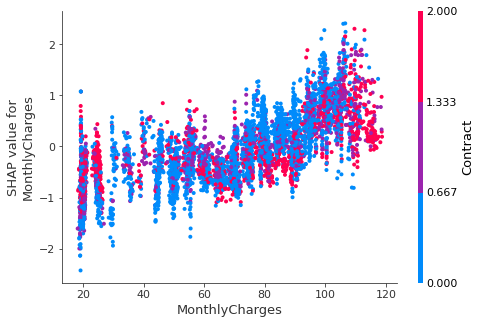

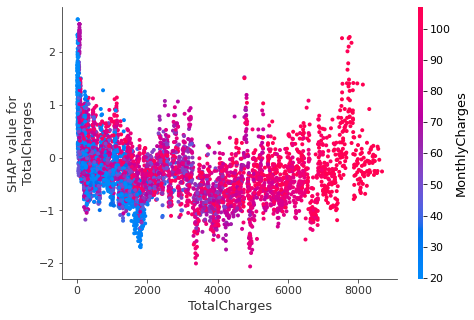

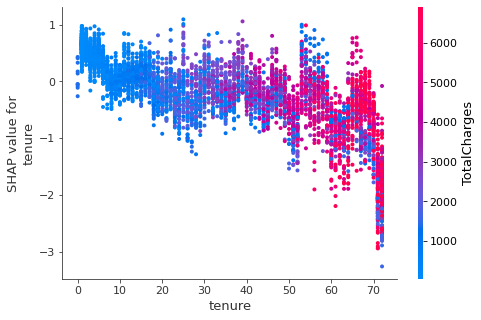

In [202]:
for cols in X_tr[['MonthlyCharges',"TotalCharges","tenure"]]:
    shap.dependence_plot(cols, shap_values, X_tr)

##### SHAP Interaction Value Summary Plot

In [246]:
shap_interaction_values = shap.TreeExplainer(model_).shap_interaction_values(pd.DataFrame(X_tr).iloc[:2000,:])

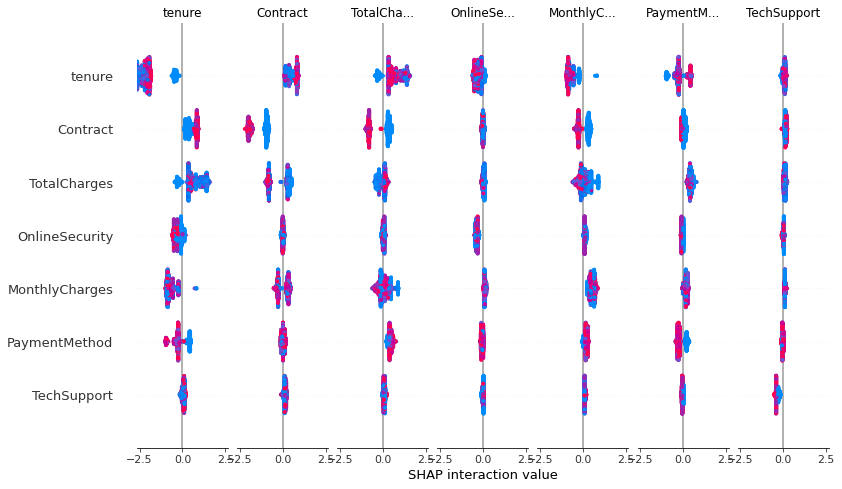

In [247]:
shap.summary_plot(shap_interaction_values, pd.DataFrame(X_tr).iloc[:2000,:])

### Feature Hidden Patterns Analysis

###### tenure

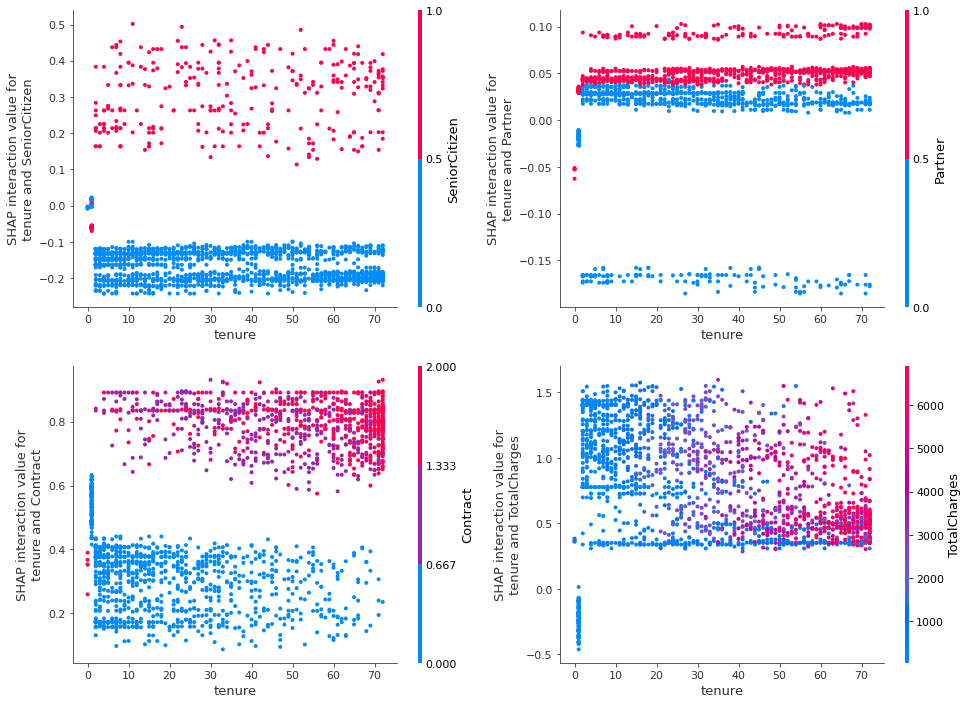

In [271]:
fig, (ax) = plt.subplots(2, 2, figsize=(16,12))
shap.dependence_plot(
    ('tenure', 'SeniorCitizen'),
    shap_interaction_values, pd.DataFrame(X_tr).iloc[:2000,:],
    display_features= X_tr.iloc[:2000,:],
    show = False,
    ax = ax[0][0]
)
shap.dependence_plot(
    ('tenure', 'Partner'),
    shap_interaction_values, pd.DataFrame(X_tr).iloc[:2000,:],
    display_features= X_tr.iloc[:2000,:],
    show = False,
    ax = ax[0][1]
)
shap.dependence_plot(
    ('tenure', 'Contract'),
    shap_interaction_values, pd.DataFrame(X_tr).iloc[:2000,:],
    display_features= X_tr.iloc[:2000,:],
    show = False,
    ax = ax[1][0]
)
shap.dependence_plot(
    ('tenure','TotalCharges'),
    shap_interaction_values, pd.DataFrame(X_tr).iloc[:2000,:],
    display_features= X_tr.iloc[:2000,:],
    show = False,
    ax = ax[1][1]
)

plt.show()

##### Monthly Charges

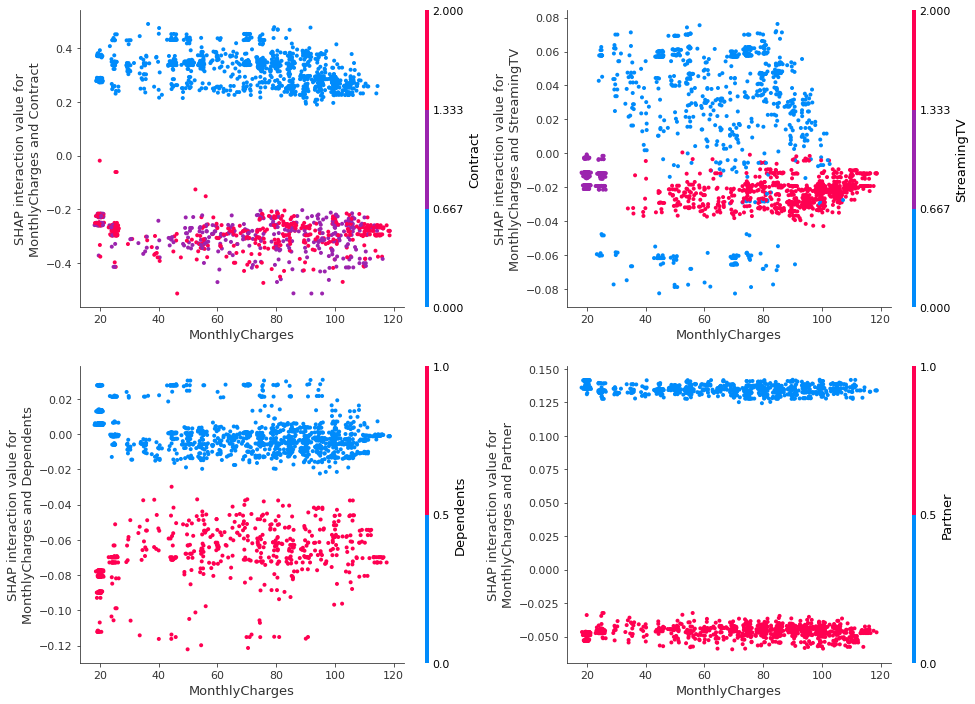

In [278]:
fig, (ax) = plt.subplots(2, 2, figsize=(16,12))
shap.dependence_plot(
    ('MonthlyCharges', 'Contract'),
    shap_interaction_values, pd.DataFrame(X_tr).iloc[:2000,:],
    display_features= X_tr.iloc[:2000,:],
    show = False,
    ax = ax[0][0]
)
shap.dependence_plot(
    ('MonthlyCharges', 'StreamingTV'),
    shap_interaction_values, pd.DataFrame(X_tr).iloc[:2000,:],
    display_features= X_tr.iloc[:2000,:],
    show = False,
    ax = ax[0][1]
)
shap.dependence_plot(
    ('MonthlyCharges', 'Dependents'),
    shap_interaction_values, pd.DataFrame(X_tr).iloc[:2000,:],
    display_features= X_tr.iloc[:2000,:],
    show = False,
    ax = ax[1][0]
)
shap.dependence_plot(
    ('MonthlyCharges','Partner'),
    shap_interaction_values, pd.DataFrame(X_tr).iloc[:2000,:],
    display_features= X_tr.iloc[:2000,:],
    show = False,
    ax = ax[1][1]
)

plt.show()

##### Total Charges

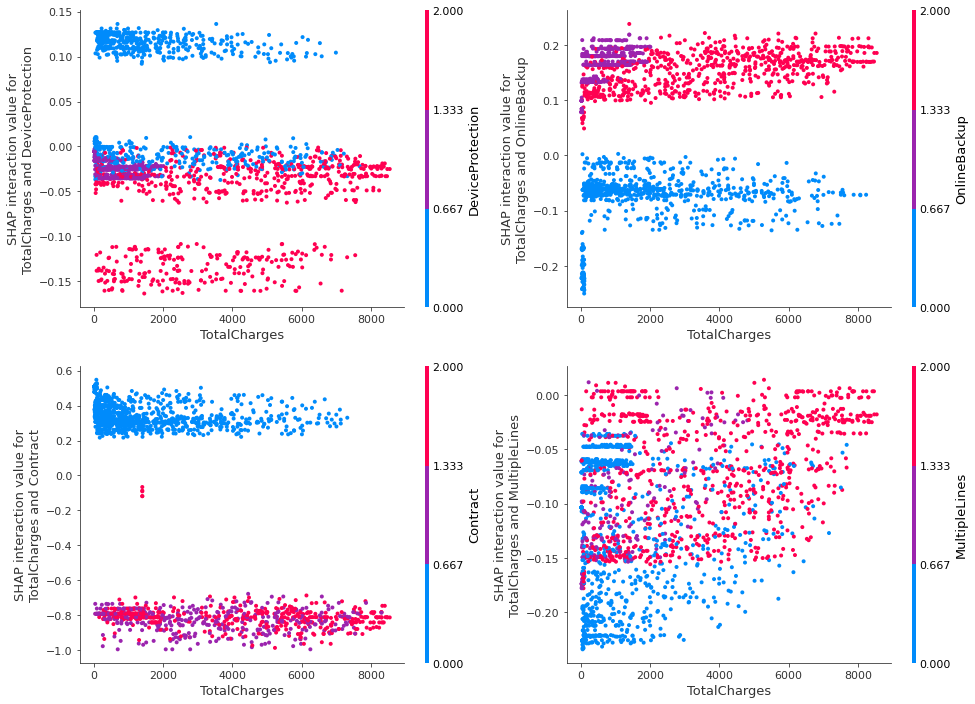

In [282]:
fig, (ax) = plt.subplots(2, 2, figsize=(16,12))
shap.dependence_plot(
    ('TotalCharges', "DeviceProtection"),
    shap_interaction_values, pd.DataFrame(X_tr).iloc[:2000,:],
    display_features= X_tr.iloc[:2000,:],
    show = False,
    ax = ax[0][0]
)
shap.dependence_plot(
    ('TotalCharges', "OnlineBackup"),
    shap_interaction_values, pd.DataFrame(X_tr).iloc[:2000,:],
    display_features= X_tr.iloc[:2000,:],
    show = False,
    ax = ax[0][1]
)
shap.dependence_plot(
    ('TotalCharges', "Contract"),
    shap_interaction_values, pd.DataFrame(X_tr).iloc[:2000,:],
    display_features= X_tr.iloc[:2000,:],
    show = False,
    ax = ax[1][0]
)
shap.dependence_plot(
    ('TotalCharges',"MultipleLines"),
    shap_interaction_values, pd.DataFrame(X_tr).iloc[:2000,:],
    display_features= X_tr.iloc[:2000,:],
    show = False,
    ax = ax[1][1]
)

plt.show()

##### Feature Desicion Explainer first 100 entries

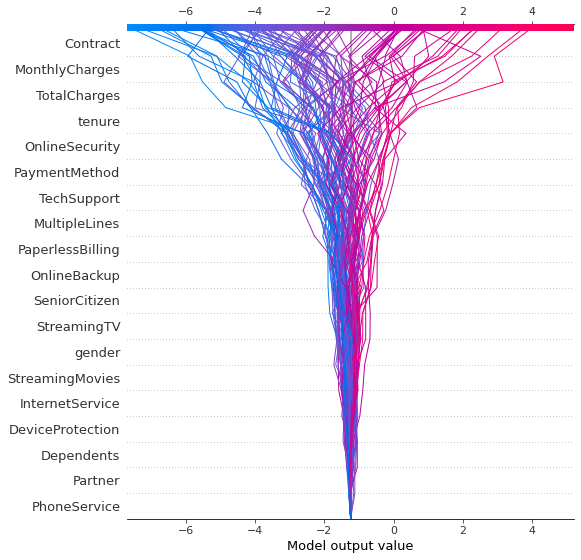

In [299]:
explainer = shap.TreeExplainer(model_)
expected_value = explainer.expected_value

shap.decision_plot(expected_value, shap_values[0:100,], pd.DataFrame(X_tr).iloc[0:100,])

#### Feature Desicion Explainer  100-200 entries

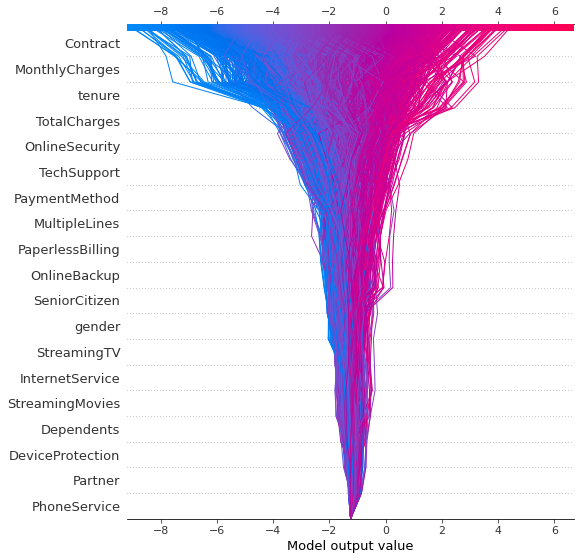

In [326]:
shap.decision_plot(expected_value, shap_values[0:1999,], pd.DataFrame(X_tr).iloc[0:1999,])

##### Feature Desicion Explainer 2000-2500 entries

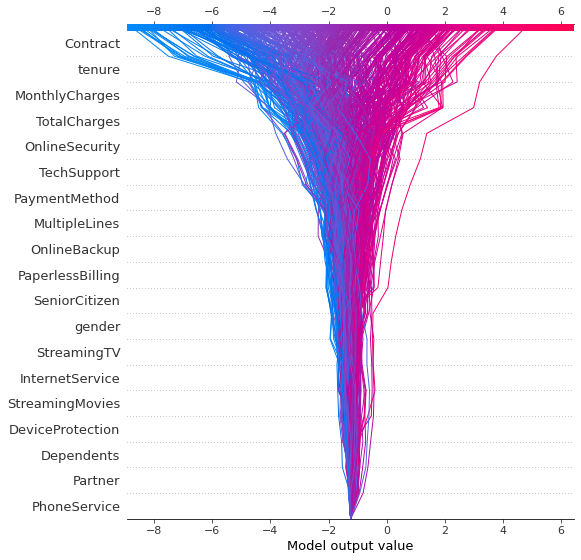

In [301]:
shap.decision_plot(expected_value, shap_values[2000:2500,], pd.DataFrame(X_tr).iloc[2000:2500,])

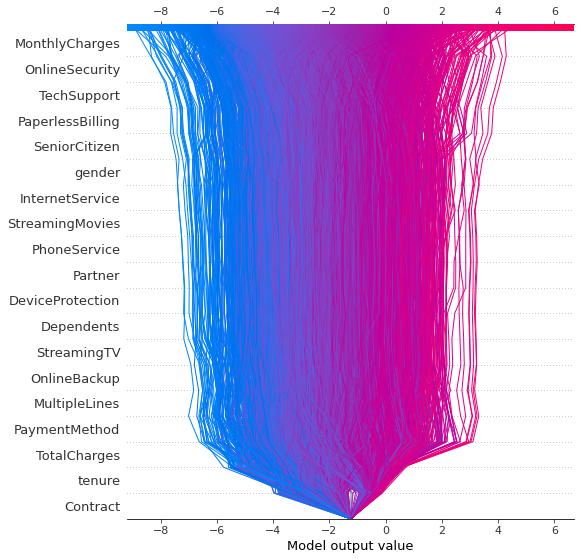

In [323]:
shap.decision_plot(expected_value, shap_values[0:1999,], pd.DataFrame(X_tr).iloc[0:1999,],  feature_order='hclust', return_objects=True)

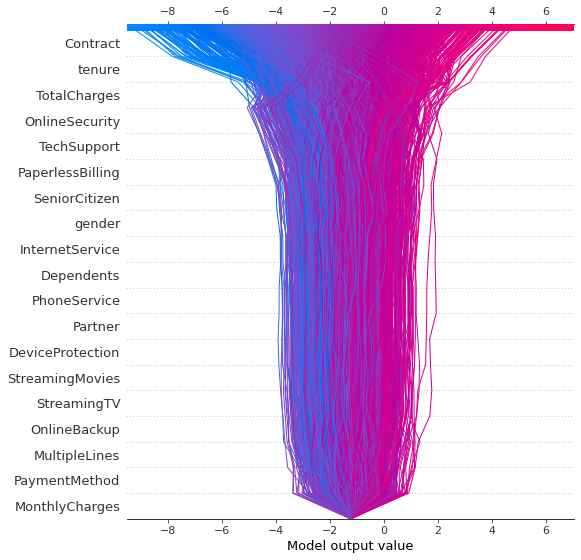

In [324]:
shap.decision_plot(expected_value, shap_values[2000:3999,], pd.DataFrame(X_tr).iloc[2000:3999,],  feature_order='hclust', return_objects=True)

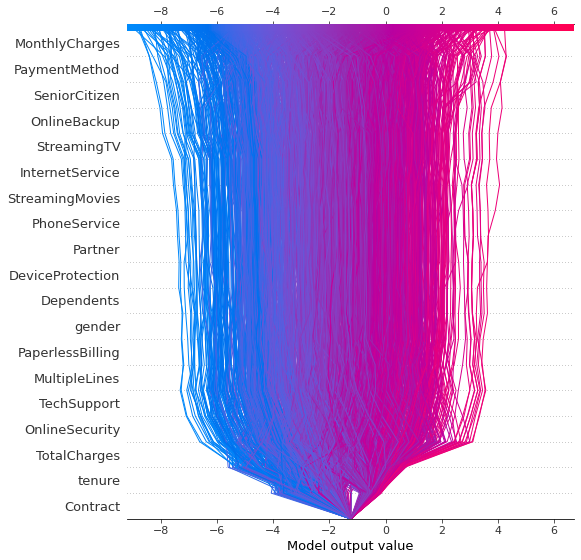

In [325]:
shap.decision_plot(expected_value, shap_values[4000:5999,], pd.DataFrame(X_tr).iloc[4000:5999,],  feature_order='hclust', return_objects=True)

In [41]:
df_s = data_le
df_y = labelencoder.fit_transform(df['Churn'])

##### SKewness

###### Cloned/Taken from https://github.com/datamadness/Automatic-skewness-transformation-for-Pandas-DataFrame/blob/master/TEST_skew_autotransform.py

In [46]:
import seaborn as sns
import numpy as np
import math
import scipy.stats as ss
import matplotlib.pyplot as plt

def skew_autotransform(DF, include = None, exclude = None, plot = False, threshold = 1, exp = False):
    
    #Get list of column names that should be processed based on input parameters
    if include is None and exclude is None:
        colnames = DF.columns.values
    elif include is not None:
        colnames = include
    elif exclude is not None:
        colnames = [item for item in list(DF.columns.values) if item not in exclude]
    else:
        print('No columns to process!')
    
    #Helper function that checks if all values are positive
    def make_positive(series):
        minimum = np.amin(series)
        #If minimum is negative, offset all values by a constant to move all values to positive teritory
        if minimum <= 0:
            series = series + abs(minimum) + 0.01
        return series
    
    
    #Go throug desired columns in DataFrame
    for col in colnames:
        #Get column skewness
        skew = DF[col].skew()
        transformed = True
        
        if plot:
            #Prep the plot of original data
            sns.set_style("darkgrid")
            sns.set_palette("Blues_r")
            fig, axes = plt.subplots(1, 2, figsize=(10, 5))
            ax1 = sns.distplot(DF[col], ax=axes[0])
            ax1.set(xlabel='Original ' + col)
        
        #If skewness is larger than threshold and positively skewed; If yes, apply appropriate transformation
        if abs(skew) > threshold and skew > 0:
            skewType = 'positive'
            #Make sure all values are positive
            DF[col] = make_positive(DF[col])
            
            if exp:
               #Apply log transformation 
               DF[col] = DF[col].apply(math.log)
            else:
                #Apply boxcox transformation
                DF[col] = ss.boxcox(DF[col])[0]
            skew_new = DF[col].skew()
         
        elif abs(skew) > threshold and skew < 0:
            skewType = 'negative'
            #Make sure all values are positive
            DF[col] = make_positive(DF[col])
            
            if exp:
               #Apply exp transformation 
               DF[col] = DF[col].pow(10)
            else:
                #Apply boxcox transformation
                DF[col] = ss.boxcox(DF[col])[0]
            skew_new = DF[col].skew()
        
        else:
            #Flag if no transformation was performed
            transformed = False
            skew_new = skew
        
        #Compare before and after if plot is True
        if plot:
            print('\n ------------------------------------------------------')     
            if transformed:
                print('\n %r had %r skewness of %2.2f' %(col, skewType, skew))
                print('\n Transformation yielded skewness of %2.2f' %(skew_new))
                sns.set_palette("Paired")
                ax2 = sns.distplot(DF[col], ax=axes[1], color = 'r')
                ax2.set(xlabel='Transformed ' + col)
                plt.show()
            else:
                print('\n NO TRANSFORMATION APPLIED FOR %r . Skewness = %2.2f' %(col, skew))
                ax2 = sns.distplot(DF[col], ax=axes[1])
                ax2.set(xlabel='NO TRANSFORM ' + col)
                plt.show()
                

    return DF


C:\Users\dell\Miniconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\dell\Miniconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)



 ------------------------------------------------------

 NO TRANSFORMATION APPLIED FOR 'gender' . Skewness = -0.02


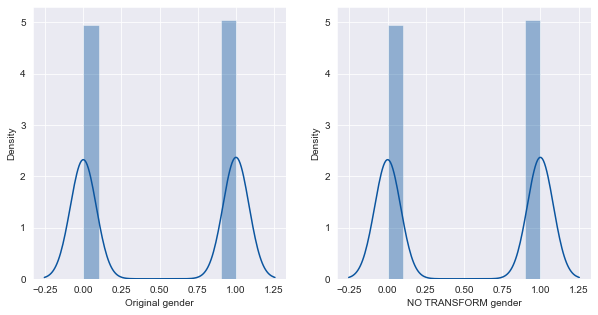

C:\Users\dell\Miniconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\dell\Miniconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)



 ------------------------------------------------------

 'SeniorCitizen' had 'positive' skewness of 1.83

 Transformation yielded skewness of 1.83


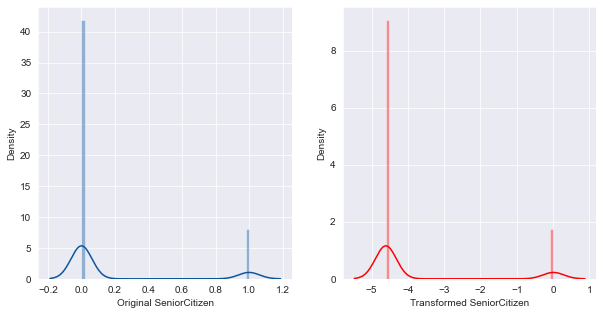

C:\Users\dell\Miniconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\dell\Miniconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)



 ------------------------------------------------------

 NO TRANSFORMATION APPLIED FOR 'Partner' . Skewness = 0.07


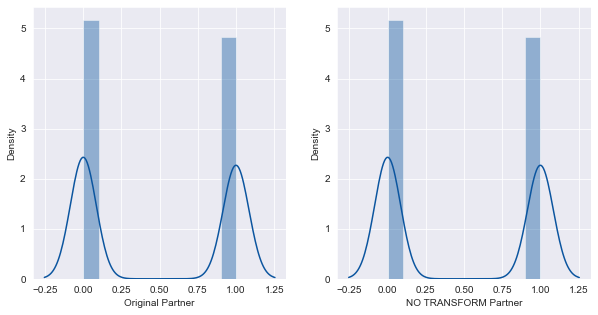

C:\Users\dell\Miniconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\dell\Miniconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)



 ------------------------------------------------------

 'Dependents' had 'positive' skewness of 0.88

 Transformation yielded skewness of 0.88


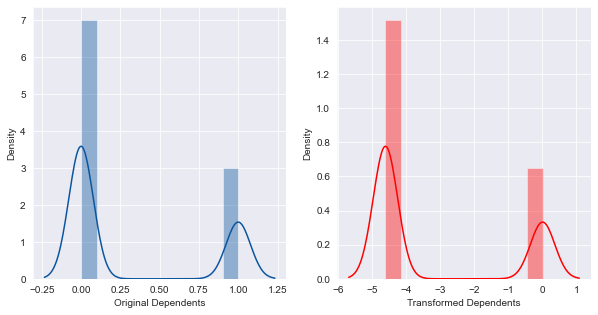

C:\Users\dell\Miniconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\dell\Miniconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)



 ------------------------------------------------------

 'PhoneService' had 'negative' skewness of -2.73

 Transformation yielded skewness of -2.73


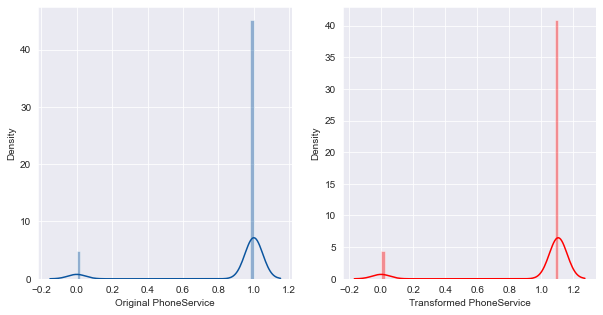

C:\Users\dell\Miniconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\dell\Miniconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)



 ------------------------------------------------------

 NO TRANSFORMATION APPLIED FOR 'MultipleLines' . Skewness = 0.12


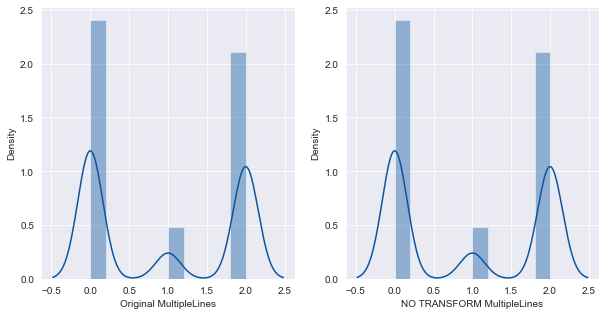

C:\Users\dell\Miniconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\dell\Miniconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)



 ------------------------------------------------------

 NO TRANSFORMATION APPLIED FOR 'InternetService' . Skewness = 0.21


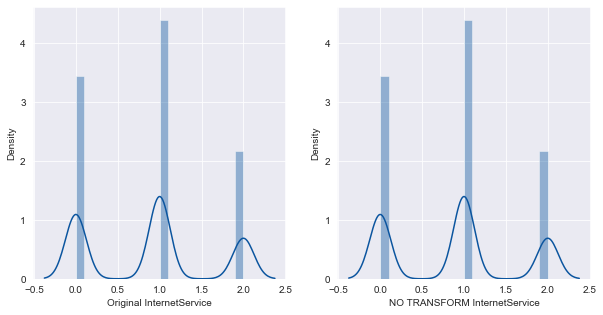

C:\Users\dell\Miniconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\dell\Miniconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)



 ------------------------------------------------------

 NO TRANSFORMATION APPLIED FOR 'OnlineSecurity' . Skewness = 0.42


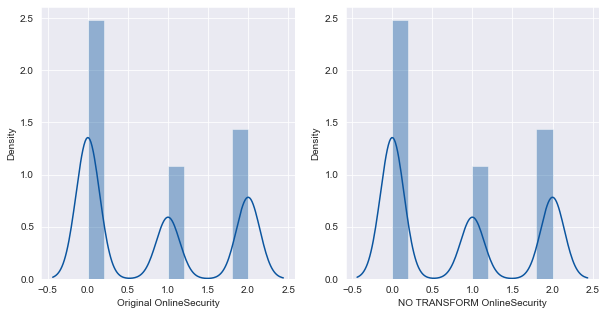

C:\Users\dell\Miniconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\dell\Miniconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)



 ------------------------------------------------------

 NO TRANSFORMATION APPLIED FOR 'OnlineBackup' . Skewness = 0.18


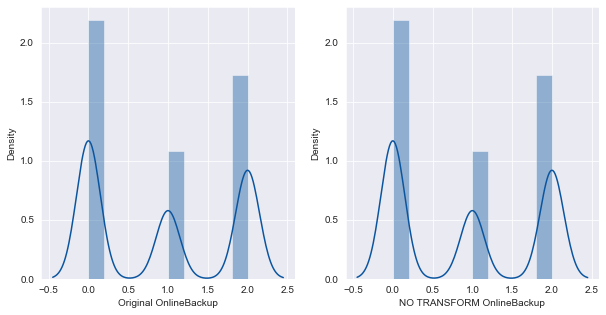

C:\Users\dell\Miniconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\dell\Miniconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)



 ------------------------------------------------------

 NO TRANSFORMATION APPLIED FOR 'DeviceProtection' . Skewness = 0.19


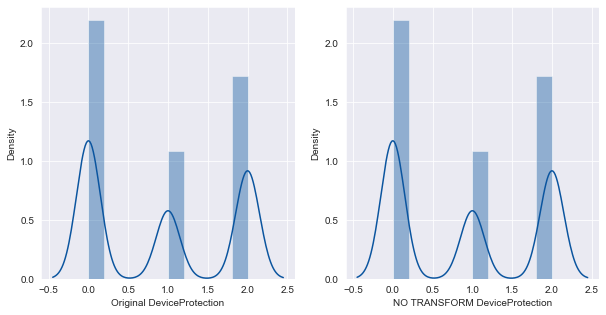

C:\Users\dell\Miniconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\dell\Miniconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)



 ------------------------------------------------------

 NO TRANSFORMATION APPLIED FOR 'TechSupport' . Skewness = 0.40


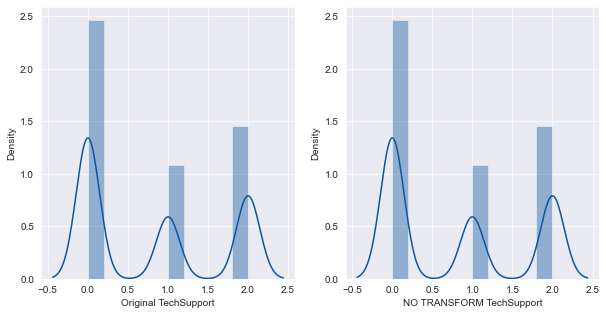

C:\Users\dell\Miniconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\dell\Miniconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)



 ------------------------------------------------------

 NO TRANSFORMATION APPLIED FOR 'StreamingTV' . Skewness = 0.03


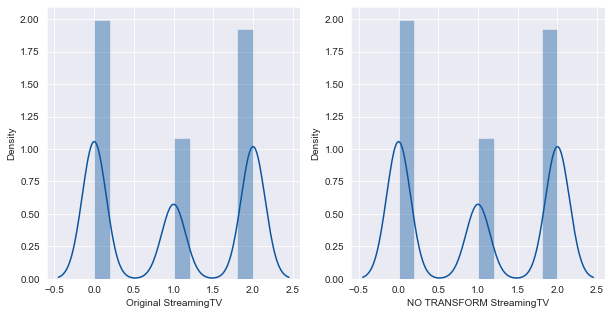

C:\Users\dell\Miniconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\dell\Miniconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)



 ------------------------------------------------------

 NO TRANSFORMATION APPLIED FOR 'StreamingMovies' . Skewness = 0.01


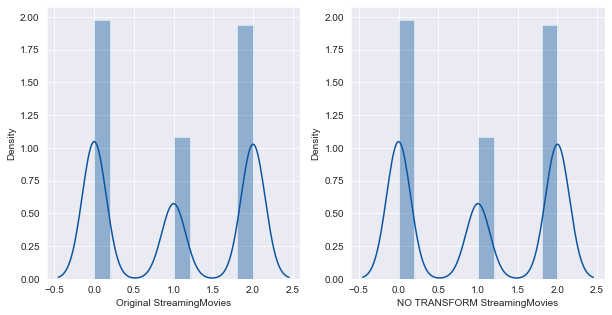

C:\Users\dell\Miniconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\dell\Miniconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)



 ------------------------------------------------------

 NO TRANSFORMATION APPLIED FOR 'Contract' . Skewness = 0.63


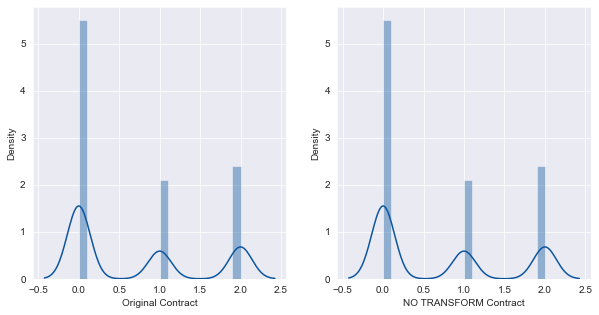

C:\Users\dell\Miniconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\dell\Miniconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)



 ------------------------------------------------------

 NO TRANSFORMATION APPLIED FOR 'PaperlessBilling' . Skewness = -0.38


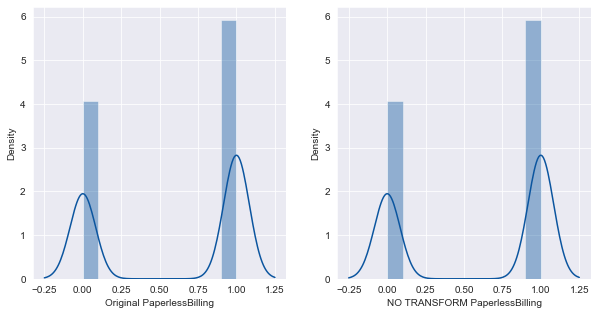

C:\Users\dell\Miniconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\dell\Miniconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)



 ------------------------------------------------------

 NO TRANSFORMATION APPLIED FOR 'PaymentMethod' . Skewness = -0.17


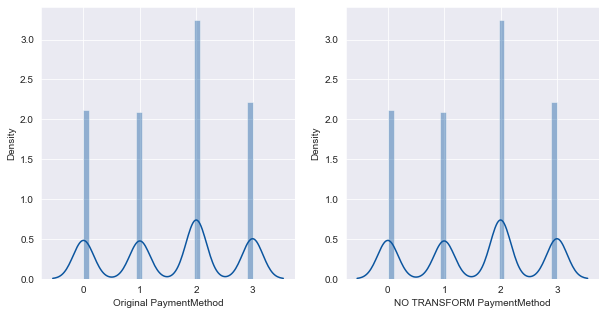

C:\Users\dell\Miniconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\dell\Miniconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)



 ------------------------------------------------------

 NO TRANSFORMATION APPLIED FOR 'tenure' . Skewness = 0.24


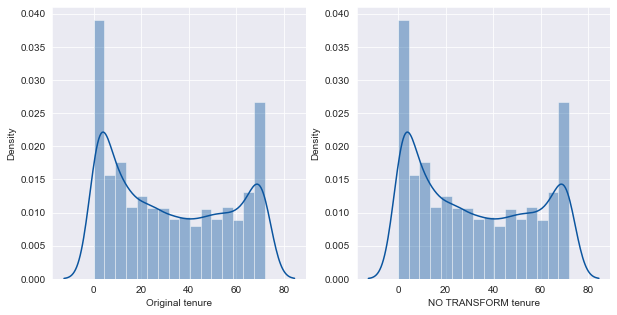

C:\Users\dell\Miniconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\dell\Miniconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)



 ------------------------------------------------------

 NO TRANSFORMATION APPLIED FOR 'MonthlyCharges' . Skewness = -0.22


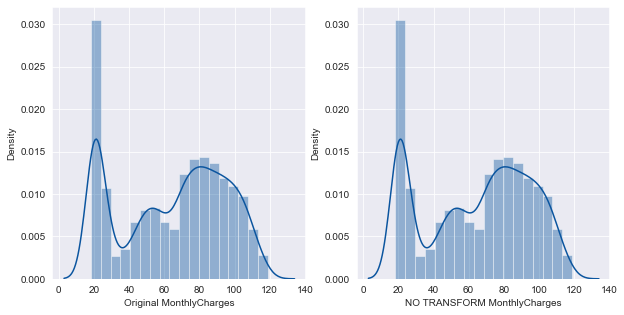

C:\Users\dell\Miniconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)



 ------------------------------------------------------

 'TotalCharges' had 'positive' skewness of 0.96

 Transformation yielded skewness of -0.75


C:\Users\dell\Miniconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


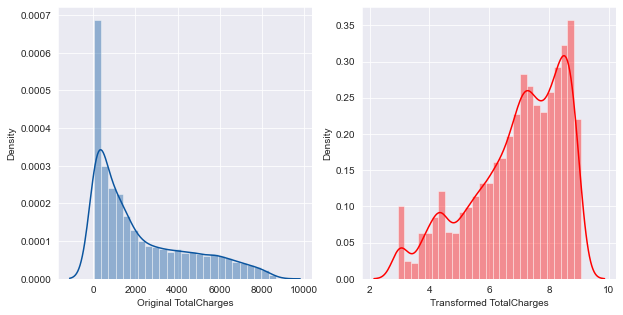

Average skewness after transformation is 0.50


In [50]:
transformedDF = skew_autotransform(df_s.copy(deep=True), plot = True, 
                                   exp = True, threshold = 0.7, exclude = ['B','LSTAT'])

print('Average skewness after transformation is %2.2f' %(np.mean(abs(transformedDF.skew()))))

### Modeling

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC, LinearSVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import Perceptron
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score,confusion_matrix, roc_auc_score, roc_curve
from sklearn.model_selection import StratifiedKFold
from imblearn.over_sampling import SMOTE
import xgboost
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier

In [76]:
# transform the dataset Oversampling to be exact
oversample = SMOTE()
x_, y_ = oversample.fit_resample(transformedDF, df_y)

x_train, x_test, y_train, y_test = train_test_split(x_, y_, test_size = 0.2) 
x__train = scaler.fit_transform(x_train)
x__test = scaler.transform(x_test)

In [116]:
LR = LogisticRegression()
SVD = SVC()
KNC = KNeighborsClassifier()
P = Perceptron()
DTC = DecisionTreeClassifier()
XGB = xgboost.XGBClassifier()
RF = RandomForestClassifier()
ML = MLPClassifier()
GBC = GradientBoostingClassifier()

##### Logistic Regression

In [77]:
param_LR = {'C':[0.001,0.01,0.1,1,10,100]}

clf= GridSearchCV(LR, param_LR, cv=5)
clf.fit(x__train, y_train)
pred=clf.predict(x__test)
acc = accuracy_score(y_test,pred)

print('accuracy_score',acc)
Acc_LR = acc

accuracy_score 0.8019323671497585


##### Support Vector Machine

In [78]:
param_SVD =  {
    'C' : [1, 2, 3, 4],
    'kernel' : ['linear', 'rbf', 'sigmoid']    
}

clf= GridSearchCV(SVD, param_LR, cv=5)
clf.fit(x__train, y_train)
pred=clf.predict(x__test)
acc = accuracy_score(y_test,pred)

print('accuracy_score',acc)

Acc_SVD = acc

accuracy_score 0.8371980676328502


##### K Neighbour Classifier

In [132]:
param_KNC = {
    'n_neighbors':np.arange(1,50),
    'leaf_size' : [30,20,40] 
}

clf= GridSearchCV(KNC, param_KNC, cv=5, n_jobs= -1)
clf.fit(x__train, y_train)
pred=clf.predict(x__test)
acc = accuracy_score(y_test,pred)

print('accuracy_score',acc)
Acc_KNC = acc

accuracy_score 0.8091787439613527


##### Perceptron

In [131]:
perceptron = Perceptron()
perceptron.fit(x__train, y_train)
pred = perceptron.predict(x__test)
acc = accuracy_score(y_test,pred)
print('accuracy_score',acc)
Acc_P = acc

accuracy_score 0.7560386473429952


##### Decision Tree Classifier

In [92]:
param_DTC = {
    'criterion' : ['gini' ,'entropy'],
    'max_depth' : [ 3, 5, 7, 9, 11, 13, 15, 17],
    "min_samples_leaf": [ 1, 3, 5, 7, 9, 13, 11]
}

clf= GridSearchCV(DTC, param_DTC, cv=5, n_jobs= -1)
clf.fit(x__train, y_train)
pred=clf.predict(x__test)
acc = accuracy_score(y_test,pred)

print('accuracy_score',acc)

Acc_DTC = acc

accuracy_score 0.8082125603864734




##### XGBoost Classifier

In [109]:
param_XGB = {
     'max_depth':range(3,10,2),
     'min_child_weight':range(1,10,2),
     'max_depth':[4,5,6,7,8],
     'min_child_weight':[4,5,6,7,8],
     'learning_rate' : [0.1, 0.001],
     'gamma':[i/10.0 for i in range(0,5)]
}

clf= GridSearchCV(XGB, param_XGB, cv=5, n_jobs= -1)
clf.fit(x__train, y_train)
pred=clf.predict(x__test)
acc = accuracy_score(y_test,pred)

print('accuracy_score',acc)

Acc_XGB = acc

accuracy_score 0.8478260869565217


##### Random Forest Classifier

In [111]:
param_RFC = {
    'max_depth' : [4, 6, 8, 10, 12],
    'max_leaf_nodes' :  [3, 6, 9, 12, 14],
    'min_samples_leaf': [1, 3, 5, 7],
    'n_estimators' : [80, 100, 120, 140]
}
clf= GridSearchCV(RF, param_RFC, cv=5, n_jobs= -1)
clf.fit(x__train, y_train)
pred=clf.predict(x__test)
acc = accuracy_score(y_test,pred)

print('accuracy_score',acc)

Acc_RFC = acc

accuracy_score 0.7961352657004831


##### MLP Classifier

In [121]:
param_ML = {
    'hidden_layer_sizes': [(10,30,10),(20,)],
    'activation': ['tanh', 'relu'],
    'solver': ['sgd', 'adam'],
    'alpha': [0.0001, 0.05],
    'learning_rate': ['constant','adaptive'],
}

clf= GridSearchCV(ML, param_ML, cv=3, n_jobs=-1)
clf.fit(x__train, y_train)
pred=clf.predict(x__test)
acc = accuracy_score(y_test,pred)

print('accuracy_score',acc)
Acc_ML = acc

accuracy_score 0.8352657004830918


C:\Users\dell\Miniconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:585: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


##### Gradient Boosting Classfier

In [123]:
param_GBC = {
    'n_estimators':range(20,81,10),
    'max_depth':range(5,16,2), 
    'min_samples_split':range(200,1001,200),
    'min_samples_leaf':range(30,71,10)
}

clf= GridSearchCV(GBC, param_GBC, cv=5, n_jobs= -1)
clf.fit(x__train, y_train)
pred=clf.predict(x__test)
acc = accuracy_score(y_test,pred)

print('accuracy_score',acc)
Acc_GBC = acc

accuracy_score 0.8444444444444444


##### Ada Boost Classifier

In [127]:
from sklearn.ensemble import AdaBoostClassifier
param_AC = {
    "base_estimator__criterion" : ["gini", "entropy"],
    "base_estimator__splitter" :   ["best", "random"],
    "algorithm" : ["SAMME","SAMME.R"],
    "n_estimators" :[10, 100, 200, 250],
    "learning_rate":  [0.05, 0.5, 1.5, 2.5]
}

AC = AdaBoostClassifier(
    DecisionTreeClassifier())

clf= GridSearchCV(AC, param_AC, cv=3, n_jobs= -1)
clf.fit(x__train, y_train)
pred=clf.predict(x__test)
acc = accuracy_score(y_test,pred)

print('accuracy_score',acc)
Acc_AC = acc

accuracy_score 0.8507246376811595


##### Models Accuracy Analysis

In [139]:
models = pd.DataFrame( {
'Models' : ['Logistic Regression', 'Support Vector Machine', 
         'KNeighbours Classfier', 'Perceptron',
         'Decision Tree Classifier', 'XGBoost Classifier',
         'Random Forest Classifier', 'Multi-Layer Perceptron',
         'Gradient Boosting Classifier', 'Ada Boost Classifier'],
'Score' : [Acc_LR*100, Acc_SVD*100, Acc_KNC*100,
        Acc_P*100, Acc_DTC*100, Acc_XGB*100,
        Acc_RF*100, Acc_ML*100, Acc_GBC*100, Acc_AC*100]
})

models.sort_values(by='Score', ascending=False)

,Models,Score
9,Ada Boost Classifier,85.072464
5,XGBoost Classifier,84.782609
8,Gradient Boosting Classifier,84.444444
1,Support Vector Machine,83.719807
7,Multi-Layer Perceptron,83.526570
2,KNeighbours Classfier,80.917874
4,Decision Tree Classifier,80.821256
0,Logistic Regression,80.193237
6,Random Forest Classifier,79.613527
3,Perceptron,75.603865


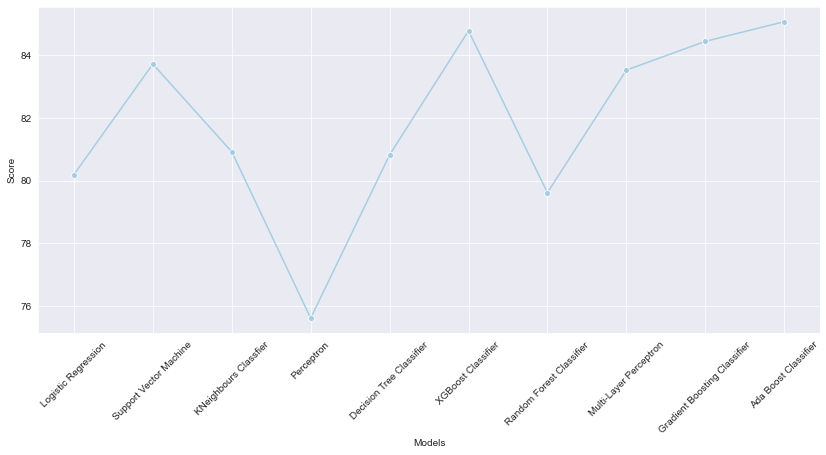

In [184]:
# models.plot(kind='line',x='Score',y='Models',figsize=(14,12))
plt.figure(figsize=(14,6))
sns.lineplot(data=models, x="Models", y="Score",ci=None, marker='o')
plt.xticks(rotation = 45)
plt.show()

##### Best Model Accuracy In-Depth Analysis (ADA Boost Classifier)

In [192]:
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

y_test_pred = clf.predict(x__test)
y_train_pred = clf.predict(x__train)

print("TRAINIG RESULTS: \n=========================================================")
clf_report = pd.DataFrame(classification_report(y_train, y_train_pred, output_dict=True))
print(f"CONFUSION MATRIX:\n{confusion_matrix(y_train, y_train_pred)}")
print("\n")
print(f"CLASSIFICATION REPORT:\n{clf_report}")
print("\n=========================================================")

print("TESTING RESULTS: \n=========================================================")
clf_report = pd.DataFrame(classification_report(y_test, y_test_pred, output_dict=True))
print(f"CONFUSION MATRIX:\n{confusion_matrix(y_test, y_test_pred)}")
print("\n")
print(f"CLASSIFICATION REPORT:\n{clf_report}")

TRAINIG RESULTS: 
CONFUSION MATRIX:
[[3227  930]
 [ 500 3621]]


CLASSIFICATION REPORT:
                     0            1  accuracy    macro avg  weighted avg
precision     0.865844     0.795649  0.827253     0.830747      0.830899
recall        0.776281     0.878670  0.827253     0.827476      0.827253
f1-score      0.818620     0.835101  0.827253     0.826861      0.826825
support    4157.000000  4121.000000  0.827253  8278.000000   8278.000000

TESTING RESULTS: 
CONFUSION MATRIX:
[[760 257]
 [138 915]]


CLASSIFICATION REPORT:
                     0            1  accuracy    macro avg  weighted avg
precision     0.846325     0.780717  0.809179     0.813521      0.812950
recall        0.747296     0.868946  0.809179     0.808121      0.809179
f1-score      0.793734     0.822472  0.809179     0.808103      0.808353
support    1017.000000  1053.000000  0.809179  2070.000000   2070.000000


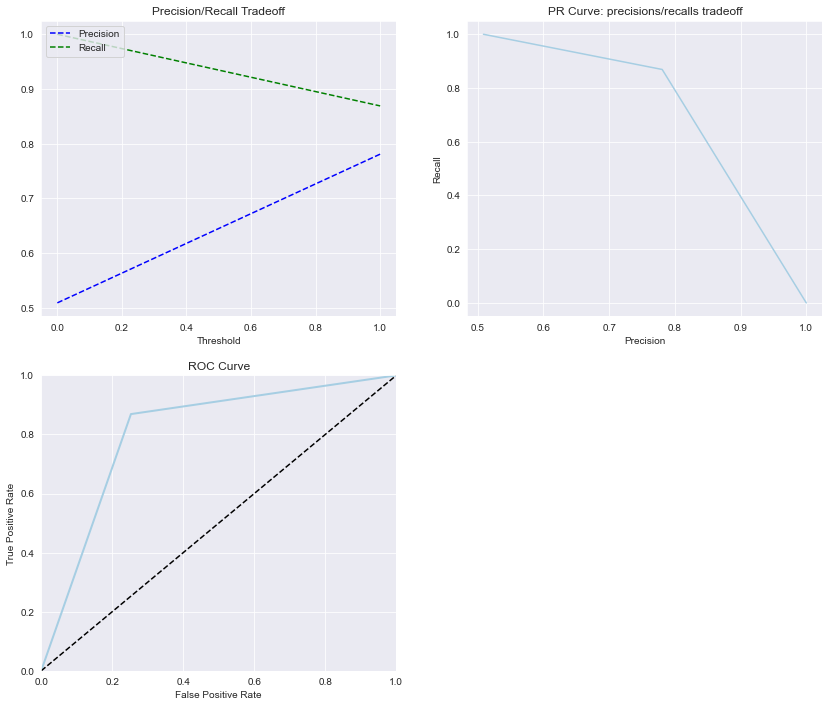

In [193]:
from sklearn.metrics import precision_recall_curve, roc_curve

def plot_precision_recall_vs_threshold(precisions, recalls, thresholds):
    plt.plot(thresholds, precisions[:-1], "b--", label="Precision")
    plt.plot(thresholds, recalls[:-1], "g--", label="Recall")
    plt.xlabel("Threshold")
    plt.legend(loc="upper left")
    plt.title("Precision/Recall Tradeoff")
    

def plot_roc_curve(fpr, tpr, label=None):
    plt.plot(fpr, tpr, linewidth=2, label=label)
    plt.plot([0, 1], [0, 1], "k--")
    plt.axis([0, 1, 0, 1])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    
    
precisions, recalls, thresholds = precision_recall_curve(y_test, clf.predict(x__test))
plt.figure(figsize=(14, 25))
plt.subplot(4, 2, 1)
plot_precision_recall_vs_threshold(precisions, recalls, thresholds)

plt.subplot(4, 2, 2)
plt.plot(precisions, recalls)
plt.xlabel("Precision")
plt.ylabel("Recall")
plt.title("PR Curve: precisions/recalls tradeoff");

plt.subplot(4, 2, 3)
fpr, tpr, thresholds = roc_curve(y_test, clf.predict(x__test))
plot_roc_curve(fpr, tpr)